# Predicting GC-like phenotype and Naive/Memory separation in B cells within the general manifold

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
# need to do 'pip3 install bbknn==1.3.8' to avoid incompatibility errors
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
%%bash

pip freeze

absl-py==0.12.0
aiohttp==3.7.4.post0
airr==1.3.1
alabaster==0.7.12
alembic @ file:///home/conda/feedstock_root/build_artifacts/alembic_1613901514078/work
anndata @ file:///home/conda/feedstock_root/build_artifacts/anndata_1605539061264/work
annoy @ file:///home/conda/feedstock_root/build_artifacts/python-annoy_1610271511811/work
anyio @ file:///home/conda/feedstock_root/build_artifacts/anyio_1614388751160/work/dist
arboreto==0.1.6
argon2-cffi @ file:///home/conda/feedstock_root/build_artifacts/argon2-cffi_1610522574055/work
async-generator==1.10
async-timeout==3.0.1
attrs @ file:///home/conda/feedstock_root/build_artifacts/attrs_1605083924122/work
Babel @ file:///home/conda/feedstock_root/build_artifacts/babel_1605182336601/work
backcall @ file:///home/conda/feedstock_root/build_artifacts/backcall_1592338393461/work
backports.functools-lru-cache==1.6.1
bbknn @ file:///opt/conda/conda-bld/bbknn_1616434096000/work
bleach @ file:///home/conda/feedstock_root/build_artifacts/bleach_16122134

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
annoy               NA
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bbknn               NA
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyte

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'

## Reading the fully analysed transcriptomics dataset (all cells manifold)

In [6]:
# normalised, log tr and scaled values in .X, HVG-subsetted
# normalised and log tr in .raw.X, all genes
adata_hvg = sc.read(save_path+'adata_hvg_BBKNN_by_sample_nodoublets_B_cells_cleanup_final_manifold.h5ad')

In [7]:
# getting predictions of old cell states
pred_table = pd.read_csv(save_path + 'predictions_from_old_twin_10X_analysis.csv',
                         index_col=0)
pred_table

,celltype_predictions,probabilities
index,,
TCAGGATCAGTTTACG-1,Doublets,0.146579
GATCGCGTCCTACAGA-1,B_cells_CTRL_like,0.137488
CTTGGCTCATTATCTC-1,Activated_CD4+_T_cells,0.100952
TGTATTCGTACGCTGC-1,T:B_doublets,0.097216
GTGTTAGGTCCGCTGA-1,Gamma/delta_T_cells,0.119183
...,...,...
TTAGGACGTTCGTCTC-1,B_cells_CD3_like,0.076452
GCGCAGTAGCCTCGTG-1,B_cells_CD3_like,0.116918
AAGACCTCAAGTAGTA-1,B_cells_CTRL_like,0.119977


In [8]:
adata_hvg.obs['cell_type_predictions'] = pred_table.loc[adata_hvg.obs_names, 'celltype_predictions']
adata_hvg.obs['probabilities'] = pred_table.loc[adata_hvg.obs_names, 'probabilities']

# 1. Predicting GC-like phenotype from the Milpied et. al. dataset

In [9]:
adata_GC_hvg = sc.read('/lustre/scratch117/cellgen/team292/aa22/adata_objects/CVID/202003_first_submission/adata_Milpied_GC_processed.h5ad')

/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


In [10]:
# if using all genes
adata_GC_hvg_full = anndata.AnnData(X = adata_GC_hvg.raw.X,
                              obs = adata_GC_hvg.obs,
                              var = adata_GC_hvg.raw.var,
                              obsm = adata_GC_hvg.obsm,
                              varm = adata_GC_hvg.raw.varm)
# scaling
sc.pp.scale(adata_GC_hvg_full, max_value=10)

In [11]:
#adata_hvg_B_cells = adata_hvg[adata_hvg.obs['cell_type_final'].isin(['B_cells_memory', 'B_cells_naive', 'Plasma_cells'])].copy()

In [12]:
adata_B_full = anndata.AnnData(X = adata_hvg.raw.X,
                              obs = adata_hvg.obs,
                              var = adata_hvg.raw.var,
                              obsm = adata_hvg.obsm,
                              varm = adata_hvg.raw.varm)

# scaling
sc.pp.scale(adata_B_full, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


# Annotation - through GC B-cell data from [Milpied et al., Nature Immunology, 2018](https://www.nature.com/articles/s41590-018-0181-4#rightslink)

In [13]:
# full (all genes) versions of the annotated object and test object
# here both the datasets are normalised, log transformed and scaled
adata_train = adata_GC_hvg_full.copy()

adata_test = adata_B_full.copy()

In [14]:
adata_test

AnnData object with n_obs × n_vars = 5119 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_predictions', 'probabilities'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

### Subsetting both datasets' copies to common genes only

I will train logreg on the subsetted data and tranfer the annotation onto the corresponding subsetted new data and then transfer that onto the full (with all genes) new dataset

In [15]:
# list of genes shared between blood and bone marrow data
# doing sorted on the overall list is VERY important for consistent ordering of the genes
common_genes = sorted(list(set(adata_train.var_names) & set(adata_test.var_names)))
print(len(common_genes),"genes are shared between previous training and test data \n",
      len(set(adata_train.var_names)), 'genes in training data \n',
      len((set(adata_test.var_names))), 'genes in test joint data \n')

13242 genes are shared between previous training and test data 
 14157 genes in training data 
 17976 genes in test joint data 



In [16]:
adata_train.var_names

Index(['FO538757.2', 'AP006222.2', 'RP11-206L10.9', 'LINC00115', 'FAM41C',
       'RP11-54O7.1', 'NOC2L', 'RP11-54O7.17', 'HES4', 'ISG15',
       ...
       'MT-ND4', 'MT-ND5', 'MT-ND6', 'MT-CYB', 'BX004987.4', 'AC145212.2',
       'AL592183.1', 'AL354822.1', 'AC004556.1', 'AC240274.1'],
      dtype='object', name='index', length=14157)

Going to copy a joint dataset with only common genes, but then transfer annotation from logreg onto the full dataset

In [17]:
adata_train_copy = adata_train[:,common_genes]

In [18]:
adata_train_copy.var_names

Index(['A1BG', 'A1BG-AS1', 'A2M-AS1', 'A4GALT', 'AAAS', 'AACS', 'AAED1',
       'AAGAB', 'AAK1', 'AAMDC',
       ...
       'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B', 'ZYX', 'ZZEF1',
       'ZZZ3', 'bP-21264C1.2'],
      dtype='object', name='index', length=13242)

In [19]:
adata_test_copy = adata_test[:,common_genes]
adata_test_copy.var_names

Index(['A1BG', 'A1BG-AS1', 'A2M-AS1', 'A4GALT', 'AAAS', 'AACS', 'AAED1',
       'AAGAB', 'AAK1', 'AAMDC',
       ...
       'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B', 'ZYX', 'ZZEF1',
       'ZZZ3', 'bP-21264C1.2'],
      dtype='object', name='index', length=13242)

In [20]:
# checking gene correspondence!
list(adata_test_copy.var_names) == list(adata_train_copy.var_names)

True

In [21]:
adata_train_copy

View of AnnData object with n_obs × n_vars = 859 × 13242
    obs: 'cell_id', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'louvain', 'cell_type'
    var: 'n_cells', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

In [22]:
np.unique(adata_train_copy.obs['cell_type'],return_counts=True)

(array(['GC_B_cells', 'Other_B_cells'], dtype=object), array([358, 501]))

# Training a logistic regression model on previously annotated SS2 data

In [23]:
adata_train_copy.obs['cell_type'].head()

index
0    Other_B_cells
1       GC_B_cells
2    Other_B_cells
3    Other_B_cells
4    Other_B_cells
Name: cell_type, dtype: category
Categories (2, object): [GC_B_cells, Other_B_cells]

In [24]:
celltypes_train = adata_train_copy.obs['cell_type']

In [25]:
adata_train_copy.X.shape

(859, 13242)

Using ONLY COMMON GENES

In [26]:
%%time
# training a logistic regression model
logisticRegr = LogisticRegression(max_iter = 10000, n_jobs = -1, random_state = 0, C=0.2)
logisticRegr.fit(adata_train_copy.X, celltypes_train)

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1544: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


CPU times: user 7.33 s, sys: 17.2 s, total: 24.5 s
Wall time: 2.64 s


LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [27]:
# already done
# Saving model based on all genes
pkl_filename = "logreg_GC_all_genes_20210216.pkl"  
with open(pkl_filename, 'wb') as file:  
    pickle.dump(logisticRegr, file)

In [ ]:
# Load model based on all genes from file
pkl_filename = "logreg_GC_all_genes_20210216.pkl"
with open(pkl_filename, 'rb') as file:  
    logisticRegr = pickle.load(file)

In [28]:
adata_train_copy

View of AnnData object with n_obs × n_vars = 859 × 13242
    obs: 'cell_id', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'louvain', 'cell_type'
    var: 'n_cells', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

In [29]:
adata_test_copy

View of AnnData object with n_obs × n_vars = 5119 × 13242
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_predictions', 'probabilities'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

In [30]:
logisticRegr

LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [31]:
%%time
predictions = logisticRegr.predict(adata_test_copy.X)
adata_test_copy.obs['GC_celltype_predictions_all_genes'] = predictions

Trying to set attribute `.obs` of view, copying.


CPU times: user 3.42 s, sys: 2.86 s, total: 6.28 s
Wall time: 5.66 s


In [32]:
%%time
# probabilities
probabilities = logisticRegr.predict_proba(adata_test_copy.X)
probs_adata = []
for i,clus in enumerate(adata_test_copy.obs['GC_celltype_predictions_all_genes']):
    probs_adata.append(probabilities[i,logisticRegr.classes_==clus][0])


CPU times: user 480 ms, sys: 1.14 s, total: 1.62 s
Wall time: 310 ms


In [33]:
# need to only assign predictions and probabilities to B cell clusters
list(adata_test_copy.obs.index) == list(adata_hvg.obs.index)

True

In [34]:
adata_test_copy.obs['probabilities_GC_all_genes'] = probs_adata

In [35]:
adata_hvg.obs['barcode'] = adata_hvg.obs.index

In [36]:
adata_hvg.obs['GC_celltype_predictions_all_genes'] = adata_test_copy.obs.loc[adata_hvg.obs_names,
                                                                             'GC_celltype_predictions_all_genes']
adata_hvg.obs['probabilities_GC_all_genes'] = adata_test_copy.obs.loc[adata_hvg.obs_names,
                                                                             'probabilities_GC_all_genes']

In [10]:
adata_hvg.obs.columns

Index(['activation', 'barcode_sample', 'batch', 'bh_pval', 'condition',
       'n_counts', 'n_genes', 'percent_mito', 'sample',
       'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet',
       'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_predictions',
       'probabilities'],
      dtype='object')

In [11]:
# read in object with latest annotation
adata_all_cells = sc.read(save_path+'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_final_manifold_with_annotation_after_celanup.h5ad')
adata_hvg.obs['annotation_final'] = adata_all_cells.obs.loc[adata_hvg.obs_names,'cell_type_corrected_final']

In [13]:
# also reading in GC predictions
GC_pred_table = pd.read_csv(save_path + 'table_predictions_GC_B_cells_20210216.csv', index_col=0)
GC_pred_table

,GC_celltype_predictions_all_genes,probabilities_GC_all_genes
index,,
TCAGGATCAGTTTACG-1,GC_B_cells,0.924863
GATCGCGTCCTACAGA-1,Other_B_cells,0.891639
CGATCGGCACGGCCAT-1,Other_B_cells,0.865484
CATGACACAACCGCCA-1,Other_B_cells,0.860315
GACAGAGAGTGTTTGC-1,Other_B_cells,0.600734
...,...,...
CGGCTAGAGGACTGGT-1,GC_B_cells,0.605533
CGACCTTAGTCAAGCG-1,Other_B_cells,0.772888
TTAGGACGTTCGTCTC-1,Other_B_cells,0.591494


In [14]:
adata_hvg.obs['GC_prediction'] = GC_pred_table.loc[adata_hvg.obs_names, 'GC_celltype_predictions_all_genes']
adata_hvg.obs['GC_prediction_probability'] = GC_pred_table.loc[adata_hvg.obs_names, 'probabilities_GC_all_genes']

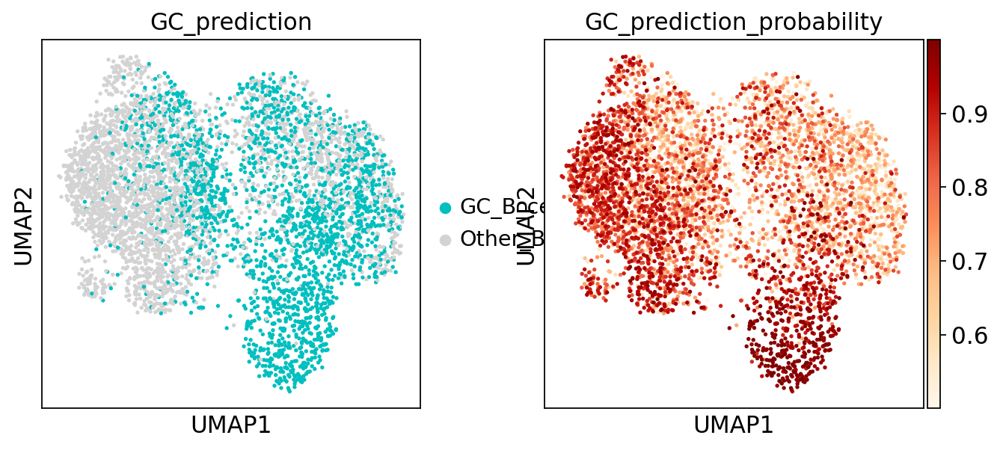

In [21]:
# saving figures for paper
sc.pl.umap(adata_hvg, color = ['GC_prediction','GC_prediction_probability'],
           ncols=3, palette = ['c','lightgrey'],
           cmap='OrRd')

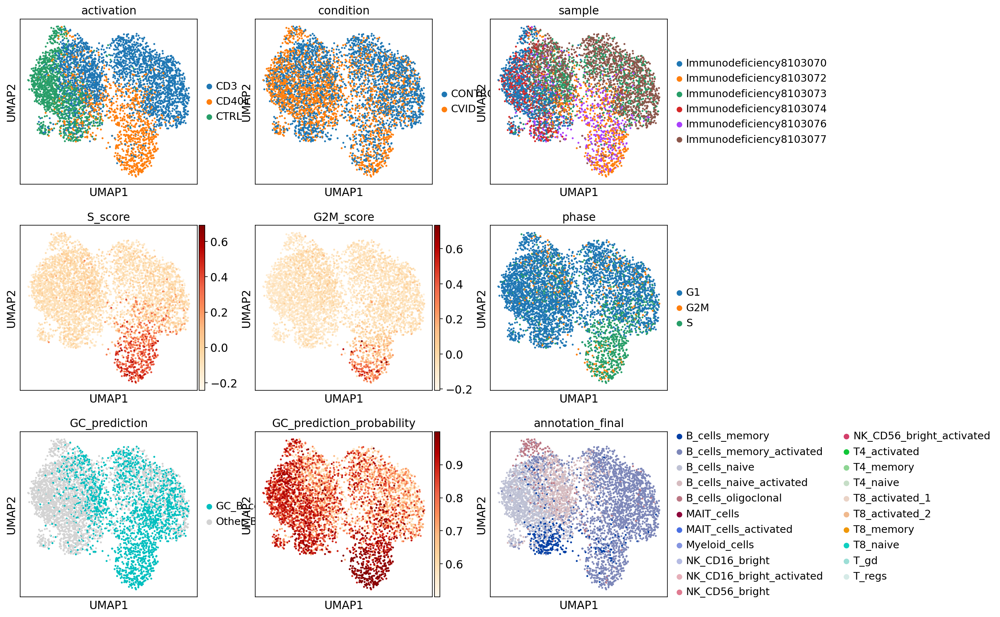

In [26]:
# saving figures for paper
sc.pl.umap(adata_hvg, color = ['activation','condition','sample','S_score', 'G2M_score', 'phase',
                              'GC_prediction','GC_prediction_probability','annotation_final'],
           ncols=3,
           cmap='OrRd',
          save = '_twins_B_cell_manifold_important_keys_20200329.pdf')

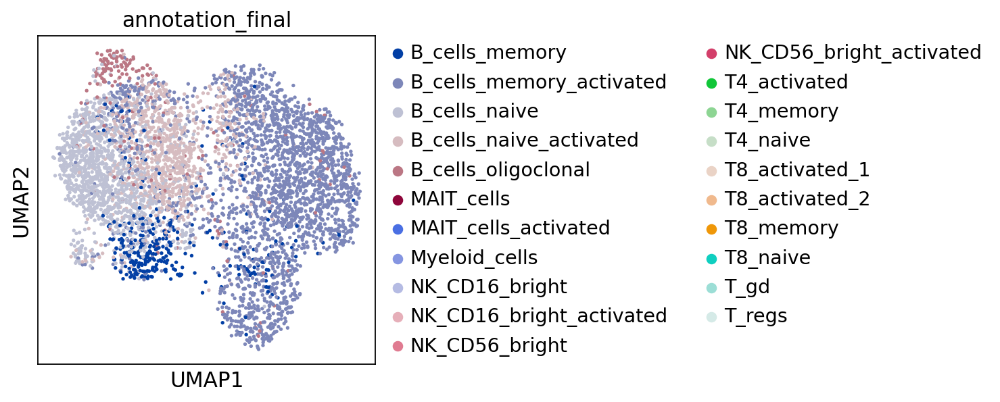

In [24]:
# saving figures for paper
sc.pl.umap(adata_hvg, color = ['annotation_final'],

           cmap='OrRd',
          save = '_twins_B_cell_manifold_final_annotation_20200329.pdf')

... storing 'cell_type_predictions' as categorical
... storing 'GC_celltype_predictions_all_genes' as categorical


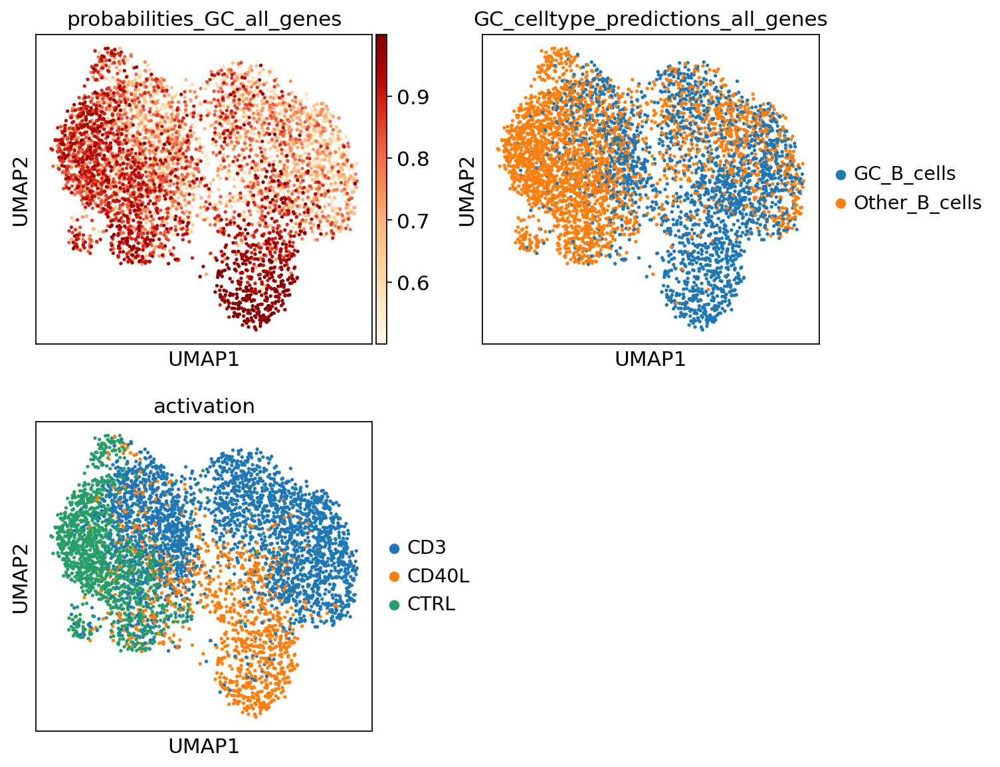

In [37]:
sc.pl.umap(adata_hvg, color = [#'probabilities_GC_hvg', 'GC_celltype_predictions_hvg',
                               'probabilities_GC_all_genes', 'GC_celltype_predictions_all_genes',
                              'activation'],
           ncols=2,
           cmap='OrRd')

In [53]:
adata_hvg.obs['GC_B_cells_prob_0.8+'] = [1 if prob > 0.8 else 0 for prob in adata_hvg.obs['probabilities_GC_all_genes']]
#adata_hvg.obs['GC_B_cells_prob_0.6+'] = [1 if prob > 0.6 else 0 for prob in adata_hvg.obs['probabilities_GC_all_genes']]

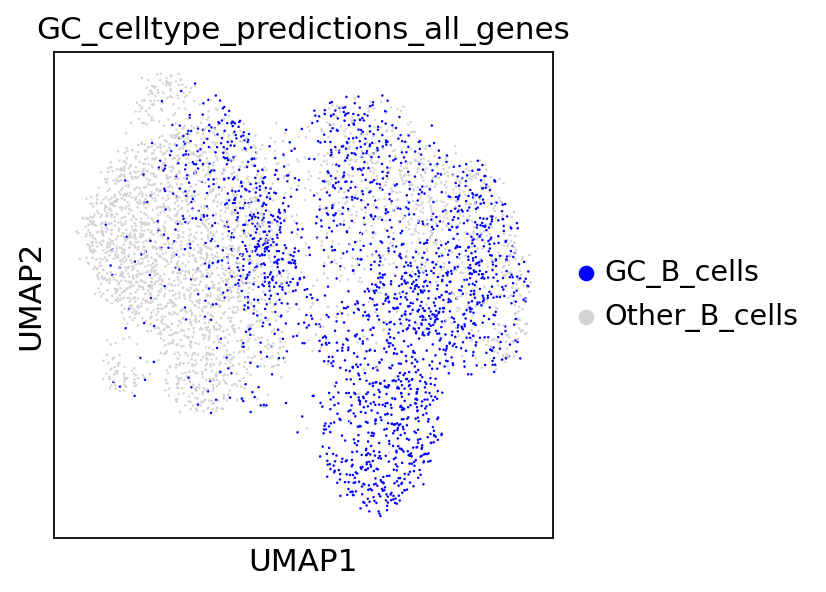

In [57]:
sc.pl.umap(adata_hvg, color = ['GC_celltype_predictions_all_genes'],
           palette=['blue','lightgrey'], s=5,
           cmap='OrRd')

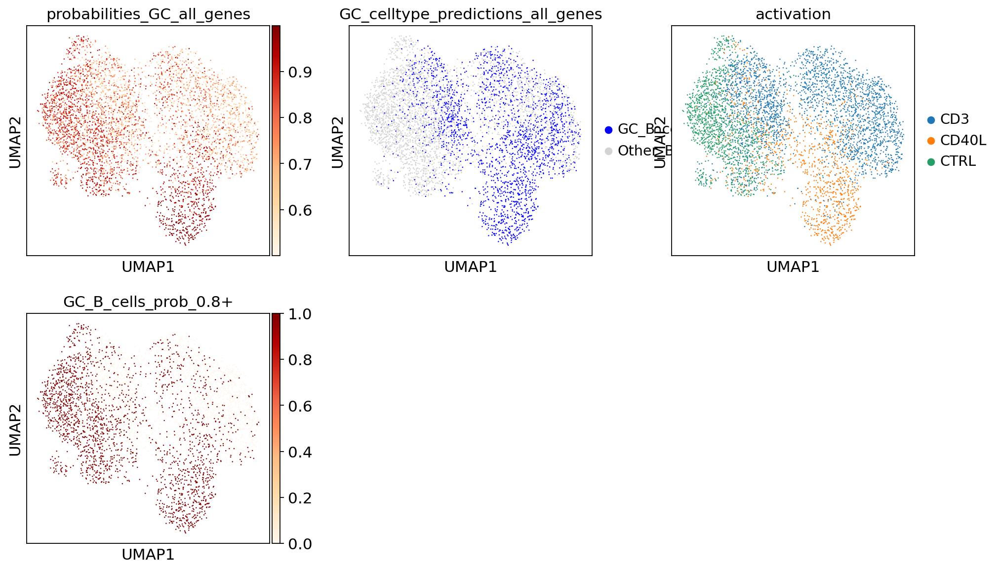

In [58]:
sc.pl.umap(adata_hvg, color = ['probabilities_GC_all_genes', 'GC_celltype_predictions_all_genes',
                              'activation', 'GC_B_cells_prob_0.8+'], s=5,
           ncols=3,
           cmap='OrRd')

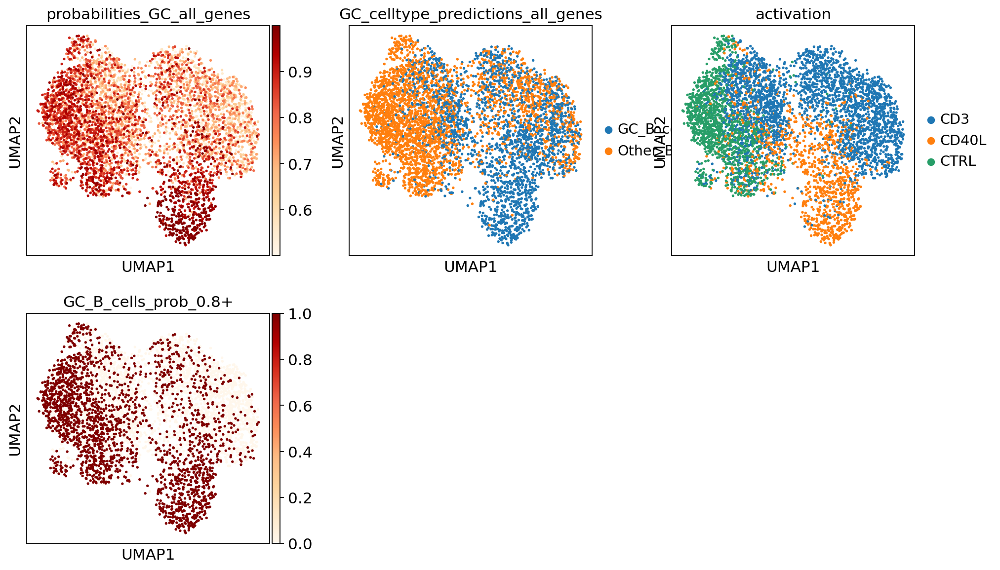

In [54]:
sc.pl.umap(adata_hvg, color = ['probabilities_GC_all_genes', 'GC_celltype_predictions_all_genes',
                              'activation', 'GC_B_cells_prob_0.8+'],
           ncols=3,
           cmap='OrRd')

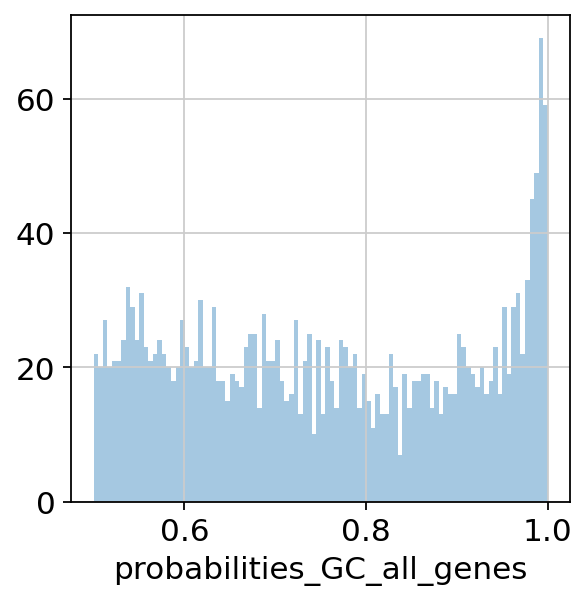

In [38]:
p3 = sns.distplot(adata_hvg[adata_hvg.obs['GC_celltype_predictions_all_genes'] == 'GC_B_cells'].obs['probabilities_GC_all_genes'], 
                  bins=100, kde=False)
plt.show()

In [41]:
np.median(adata_hvg[adata_hvg.obs['GC_celltype_predictions_all_genes'] == 'GC_B_cells'].obs['probabilities_GC_all_genes'])

0.7504554834247921

In [42]:
table_predictions = adata_hvg.obs.loc[:, ['GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes']]

In [43]:
table_predictions.head()

,GC_celltype_predictions_all_genes,probabilities_GC_all_genes
index,,
TCAGGATCAGTTTACG-1,GC_B_cells,0.924863
GATCGCGTCCTACAGA-1,Other_B_cells,0.891639
CGATCGGCACGGCCAT-1,Other_B_cells,0.865484
CATGACACAACCGCCA-1,Other_B_cells,0.860315
GACAGAGAGTGTTTGC-1,Other_B_cells,0.600734


In [44]:
table_predictions.shape

(5119, 2)

In [45]:
table_predictions.to_csv(save_path + 'table_predictions_GC_B_cells_20210216.csv')

# 2. Predicting Naive/Memory B cells from (a) old SS2 data

In [59]:
adata_SS2_hvg = sc.read('/home/jovyan/notebooks/Vento_Lab/CVID/GitHub_to_post/CVID_old_full/scTranscriptomics/adata_SS2_corrected.h5ad')

/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


In [60]:
adata_SS2_hvg

AnnData object with n_obs × n_vars = 1324 × 6228
    obs: 'batch', 'batchcode', 'bh_pval', 'celltype', 'lane', 'n_counts', 'n_genes', 'percent_mito', 'scrublet_cluster_score', 'scrublet_score', 'treatment', 'is_doublet', 'louvain', 'is_doublet_poptrim', 'cell_id'
    var: 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

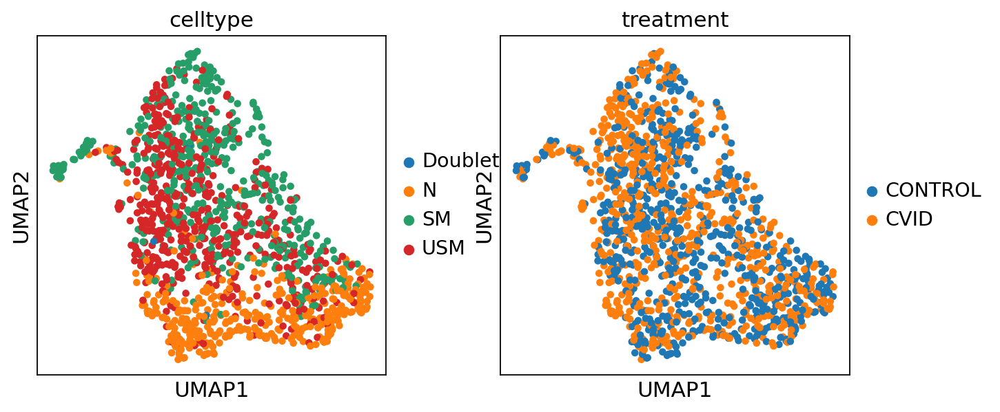

In [61]:
sc.pl.umap(adata_SS2_hvg, color=['celltype','treatment'])

In [62]:
# if using all genes
adata_SS2_hvg_full = anndata.AnnData(X = adata_SS2_hvg.raw.X,
                              obs = adata_SS2_hvg.obs,
                              var = adata_SS2_hvg.raw.var,
                              obsm = adata_SS2_hvg.obsm,
                              varm = adata_SS2_hvg.raw.varm)
# scaling
sc.pp.scale(adata_SS2_hvg_full, max_value=10)

In [63]:
adata_B_full = anndata.AnnData(X = adata_hvg.raw.X,
                              obs = adata_hvg.obs,
                              var = adata_hvg.raw.var,
                              obsm = adata_hvg.obsm,
                              varm = adata_hvg.raw.varm)

# scaling
sc.pp.scale(adata_B_full, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [64]:
# full (all genes) versions of the annotated object and test object
# here both the datasets are normalised, log transformed and scaled
adata_train = adata_SS2_hvg_full.copy()

adata_test = adata_B_full.copy()

In [65]:
adata_test

AnnData object with n_obs × n_vars = 5119 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_predictions', 'probabilities', 'barcode', 'GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes', 'GC_B_cells_prob_0.8+', 'GC_B_cells_prob_0.5+', 'GC_B_cells_prob_0.6+'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

### Subsetting both datasets' copies to common genes only

I will train logreg on the subsetted data and tranfer the annotation onto the corresponding subsetted new data and then transfer that onto the full (with all genes) new dataset

In [66]:
# list of genes shared between blood and bone marrow data
# doing sorted on the overall list is VERY important for consistent ordering of the genes
common_genes = sorted(list(set(adata_train.var_names) & set(adata_test.var_names)))
print(len(common_genes),"genes are shared between previous training and test data \n",
      len(set(adata_train.var_names)), 'genes in training data \n',
      len((set(adata_test.var_names))), 'genes in test joint data \n')

15669 genes are shared between previous training and test data 
 21030 genes in training data 
 17976 genes in test joint data 



In [67]:
adata_train.var_names

Index(['TSPAN6', 'DPM1', 'SCYL3', 'C1orf112', 'FGR', 'CFH', 'FUCA2', 'GCLC',
       'NFYA', 'STPG1',
       ...
       'RP11-108M9.2', 'RP11-116D17.3', 'IL12B', 'ATP11A-AS1', 'REEP1',
       'RP11-191L9.4', 'ZNF695', 'C16orf47', 'CYSLTR2', 'POU5F1B'],
      dtype='object', name='index', length=21030)

Going to copy a joint dataset with only common genes, but then transfer annotation from logreg onto the full dataset

In [68]:
adata_train_copy = adata_train[:,common_genes]

In [69]:
adata_train_copy.var_names

Index(['A1BG', 'A1BG-AS1', 'A2M', 'A4GALT', 'AAAS', 'AACS', 'AAED1', 'AAGAB',
       'AAK1', 'AAMDC',
       ...
       'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B', 'ZYX', 'ZZEF1',
       'ZZZ3', 'bP-21264C1.2'],
      dtype='object', name='index', length=15669)

In [70]:
adata_test_copy = adata_test[:,common_genes]
adata_test_copy.var_names

Index(['A1BG', 'A1BG-AS1', 'A2M', 'A4GALT', 'AAAS', 'AACS', 'AAED1', 'AAGAB',
       'AAK1', 'AAMDC',
       ...
       'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B', 'ZYX', 'ZZEF1',
       'ZZZ3', 'bP-21264C1.2'],
      dtype='object', name='index', length=15669)

In [71]:
# checking gene correspondence!
list(adata_test_copy.var_names) == list(adata_train_copy.var_names)

True

In [72]:
adata_train_copy

View of AnnData object with n_obs × n_vars = 1324 × 15669
    obs: 'batch', 'batchcode', 'bh_pval', 'celltype', 'lane', 'n_counts', 'n_genes', 'percent_mito', 'scrublet_cluster_score', 'scrublet_score', 'treatment', 'is_doublet', 'louvain', 'is_doublet_poptrim', 'cell_id'
    var: 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

In [73]:
np.unique(adata_train_copy.obs['celltype'],return_counts=True)

(array(['Doublets', 'N', 'SM', 'USM'], dtype=object),
 array([  4, 377, 450, 493]))

# Training a logistic regression model on previously annotated SS2 data

In [74]:
adata_train_copy.obs['celltype'].head()

index
SCGC--2500_C02    N
SCGC--2499_C03    N
SCGC--2500_C03    N
SCGC--2499_C04    N
SCGC--2500_C04    N
Name: celltype, dtype: category
Categories (4, object): [Doublets, N, SM, USM]

In [75]:
celltypes_train = adata_train_copy.obs['celltype']

In [76]:
adata_train_copy.X.shape

(1324, 15669)

Using ONLY COMMON GENES

In [77]:
%%time
# training a logistic regression model
logisticRegr = LogisticRegression(max_iter = 10000, n_jobs = -1, random_state = 0, C=0.2)
logisticRegr.fit(adata_train_copy.X, celltypes_train)

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1544: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


CPU times: user 2min 45s, sys: 6min 17s, total: 9min 3s
Wall time: 36.2 s


LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [78]:
# already done
# Saving model based on all genes
pkl_filename = "logreg_from_SS2_all_genes_20210216.pkl"  
with open(pkl_filename, 'wb') as file:  
    pickle.dump(logisticRegr, file)

In [79]:
adata_train_copy

View of AnnData object with n_obs × n_vars = 1324 × 15669
    obs: 'batch', 'batchcode', 'bh_pval', 'celltype', 'lane', 'n_counts', 'n_genes', 'percent_mito', 'scrublet_cluster_score', 'scrublet_score', 'treatment', 'is_doublet', 'louvain', 'is_doublet_poptrim', 'cell_id'
    var: 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

In [80]:
adata_test_copy

View of AnnData object with n_obs × n_vars = 5119 × 15669
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_predictions', 'probabilities', 'barcode', 'GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes', 'GC_B_cells_prob_0.8+', 'GC_B_cells_prob_0.5+', 'GC_B_cells_prob_0.6+'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

In [81]:
logisticRegr

LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [82]:
%%time
predictions = logisticRegr.predict(adata_test_copy.X)
adata_test_copy.obs['celltype_predictions_all_genes_from_SS2'] = predictions

Trying to set attribute `.obs` of view, copying.


CPU times: user 6.19 s, sys: 1.91 s, total: 8.1 s
Wall time: 6.19 s


In [83]:
%%time
# probabilities
probabilities = logisticRegr.predict_proba(adata_test_copy.X)
probs_adata = []
for i,clus in enumerate(adata_test_copy.obs['celltype_predictions_all_genes_from_SS2']):
    probs_adata.append(probabilities[i,logisticRegr.classes_==clus][0])


CPU times: user 568 ms, sys: 1.44 s, total: 2 s
Wall time: 1.34 s


In [84]:
# need to only assign predictions and probabilities to B cell clusters
list(adata_test_copy.obs.index) == list(adata_hvg.obs.index)

True

In [85]:
adata_test_copy.obs['probabilities_from_SS2_all_genes'] = probs_adata

In [86]:
adata_hvg.obs['barcode'] = adata_hvg.obs.index

In [87]:
adata_hvg.obs['celltype_predictions_all_genes_from_SS2'] = adata_test_copy.obs.loc[adata_hvg.obs_names, 'celltype_predictions_all_genes_from_SS2']
adata_hvg.obs['probabilities_from_SS2_all_genes'] = adata_test_copy.obs.loc[adata_hvg.obs_names, 'probabilities_from_SS2_all_genes']

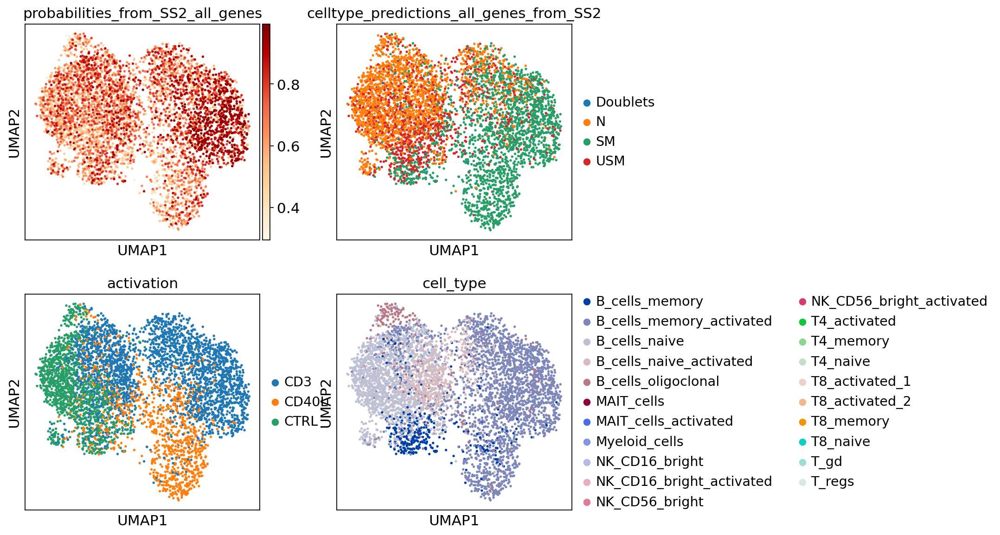

In [93]:
sc.pl.umap(adata_hvg, color = [#'probabilities_GC_hvgs', 'GC_celltype_predictions_hvgs',
                               'probabilities_from_SS2_all_genes', 'celltype_predictions_all_genes_from_SS2',
                              'activation', 'cell_type'],
           ncols=2,
           cmap='OrRd')

In [89]:
table_predictions_from_SS2 = adata_hvg.obs.loc[:, ['celltype_predictions_all_genes_from_SS2', 'probabilities_from_SS2_all_genes']]

In [94]:
table_predictions_from_SS2.head()

,celltype_predictions_all_genes_from_SS2,probabilities_from_SS2_all_genes
index,,
TCAGGATCAGTTTACG-1,SM,0.513712
GATCGCGTCCTACAGA-1,USM,0.501827
CGATCGGCACGGCCAT-1,N,0.904602
CATGACACAACCGCCA-1,N,0.643940
GACAGAGAGTGTTTGC-1,N,0.783648


In [95]:
table_predictions_from_SS2.shape

(5119, 2)

In [92]:
table_predictions_from_SS2.to_csv(save_path + 'table_predictions_N_USM_SM_B_cells_from_SS2_202102016.csv')

# 3. Predicting Naive/Memory B cells from (c) Hamish King's [paper](https://www.biorxiv.org/content/10.1101/2020.04.28.054775v2.full.pdf)

In [96]:
# raw GEX counts - takes a while to read
Hamish_X = pd.read_csv('/lustre/scratch117/cellgen/team292/aa22/Hamish_B_cells/SEURAT_OBJECTS/Hamish_all_cells_raw_counts.csv', sep='\t',
                      index_col=0)
# to get cells x genes matrix
Hamish_X = Hamish_X.T

# metadata with annotation in 'CellType'
Hamish_meta = pd.read_csv('/lustre/scratch117/cellgen/team292/aa22/Hamish_B_cells/SEURAT_OBJECTS/Hamish_all_cells_raw_counts_metadata.csv',
                         sep='\t', index_col=0)

In [97]:
Hamish_X

,AL627309.1,AL669831.5,LINC00115,FAM41C,NOC2L,KLHL17,HES4,ISG15,AGRN,C1orf159,...,AC006486.1,AC005392.2,NUCB1-AS1,LRRC4B,KIR2DL1,SLC7A4,MCHR1,AL031593.1,MOV10L1,AC007325.2
BCP3_MBC_AAAGTAGGTACATCCA,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BCP3_MBC_AACACGTCAGGGCATA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BCP3_MBC_AATCCAGCAGTCTTCC,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
BCP3_MBC_ACACTGAAGTGAAGAG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BCP3_MBC_ACGCCGACACTGCCAG,0,0,0,0,1,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BCP9_MBC_TTTGTCAGTGCAACGA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BCP9_MBC_TTTGTCATCAGTTGAC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BCP9_MBC_TTTGTCATCATAAAGG,0,0,0,0,2,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
BCP9_MBC_TTTGTCATCGCAAGCC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [98]:
# is this raw values? looks like it
np.unique(Hamish_X.loc['BCP9_MBC_TTTGTCAGTGCAACGA'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 25, 26, 29, 30, 31, 32, 33, 35, 36, 37,
       38, 43, 44, 45, 59, 71, 73, 84, 90])

In [99]:
Hamish_meta

,nCount_RNA,nFeature_RNA,percent.mito,percent.ribo,Donor,Sample,Assay,Status,S.Score,G2M.Score,...,IGL_C_Gene,IGL_VDJ_Gene,IGL_FullLength,IGL_Productive,IGH_UMIS,IGH_MU_FREQ,IGK_UMIS,IGL_UMIS,Subset,MBC_Subset
BCP3_MBC_AAAGTAGGTACATCCA,3004,1374,0.069825,0.240234,BCP3,BCP3_MBC,5P,OSA,-0.067548,-0.009587,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TfH,NaN
BCP3_MBC_AACACGTCAGGGCATA,6808,1823,0.031561,0.430196,BCP3,BCP3_MBC,5P,OSA,-0.015705,-0.010687,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CD4+,NaN
BCP3_MBC_AATCCAGCAGTCTTCC,7931,2668,0.048512,0.264428,BCP3,BCP3_MBC,5P,OSA,-0.010340,0.031842,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Treg,NaN
BCP3_MBC_ACACTGAAGTGAAGAG,2942,1233,0.041626,0.312846,BCP3,BCP3_MBC,5P,OSA,-0.006046,0.010788,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CD8+ Cytotoxic,NaN
BCP3_MBC_ACGCCGACACTGCCAG,6670,2228,0.051384,0.317530,BCP3,BCP3_MBC,5P,OSA,-0.046711,-0.048320,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CD8+ Cytotoxic,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BCP9_MBC_TTTGTCAGTGCAACGA,4054,1416,0.029447,0.361025,BCP9,BCP9_MBC,5P,RT,-0.059853,-0.023815,...,None,None,None,None,9.0,0.040115,10.0,NaN,MBC,Activated 1
BCP9_MBC_TTTGTCATCAGTTGAC,7409,1955,0.054478,0.353917,BCP9,BCP9_MBC,5P,RT,0.017466,-0.021195,...,IGLC2,IGLV1-44 None IGLJ2,2,2,10.0,0.042735,NaN,36.0,MBC,Activated 2
BCP9_MBC_TTTGTCATCATAAAGG,6863,1979,0.055319,0.372368,BCP9,BCP9_MBC,5P,RT,-0.055596,-0.005647,...,None,None,None,None,12.0,0.071642,NaN,NaN,MBC,preGC MBC
BCP9_MBC_TTTGTCATCGCAAGCC,3386,1290,0.054982,0.314541,BCP9,BCP9_MBC,5P,RT,-0.075837,-0.045703,...,IGLC2,IGLV3-1 None IGLJ2,2,2,3.0,0.026627,NaN,32.0,MBC,Activated 1


In [100]:
len(set(Hamish_meta.index) & set(Hamish_X.index))

52766

In [101]:
Hamish_var = pd.DataFrame(Hamish_X.columns)
Hamish_var.set_index(0, inplace=True)

In [102]:
adata_Hamish = anndata.AnnData(X = Hamish_X.values,
                              obs = Hamish_meta,
                              var = Hamish_var)

In [103]:
adata_Hamish.var

""
0
AL627309.1
AL669831.5
LINC00115
FAM41C
NOC2L
...
SLC7A4
MCHR1
AL031593.1


In [104]:
adata_Hamish.obs

,nCount_RNA,nFeature_RNA,percent.mito,percent.ribo,Donor,Sample,Assay,Status,S.Score,G2M.Score,...,IGL_C_Gene,IGL_VDJ_Gene,IGL_FullLength,IGL_Productive,IGH_UMIS,IGH_MU_FREQ,IGK_UMIS,IGL_UMIS,Subset,MBC_Subset
BCP3_MBC_AAAGTAGGTACATCCA,3004,1374,0.069825,0.240234,BCP3,BCP3_MBC,5P,OSA,-0.067548,-0.009587,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TfH,NaN
BCP3_MBC_AACACGTCAGGGCATA,6808,1823,0.031561,0.430196,BCP3,BCP3_MBC,5P,OSA,-0.015705,-0.010687,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CD4+,NaN
BCP3_MBC_AATCCAGCAGTCTTCC,7931,2668,0.048512,0.264428,BCP3,BCP3_MBC,5P,OSA,-0.010340,0.031842,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Treg,NaN
BCP3_MBC_ACACTGAAGTGAAGAG,2942,1233,0.041626,0.312846,BCP3,BCP3_MBC,5P,OSA,-0.006046,0.010788,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CD8+ Cytotoxic,NaN
BCP3_MBC_ACGCCGACACTGCCAG,6670,2228,0.051384,0.317530,BCP3,BCP3_MBC,5P,OSA,-0.046711,-0.048320,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CD8+ Cytotoxic,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BCP9_MBC_TTTGTCAGTGCAACGA,4054,1416,0.029447,0.361025,BCP9,BCP9_MBC,5P,RT,-0.059853,-0.023815,...,None,None,None,None,9.0,0.040115,10.0,NaN,MBC,Activated 1
BCP9_MBC_TTTGTCATCAGTTGAC,7409,1955,0.054478,0.353917,BCP9,BCP9_MBC,5P,RT,0.017466,-0.021195,...,IGLC2,IGLV1-44 None IGLJ2,2,2,10.0,0.042735,NaN,36.0,MBC,Activated 2
BCP9_MBC_TTTGTCATCATAAAGG,6863,1979,0.055319,0.372368,BCP9,BCP9_MBC,5P,RT,-0.055596,-0.005647,...,None,None,None,None,12.0,0.071642,NaN,NaN,MBC,preGC MBC
BCP9_MBC_TTTGTCATCGCAAGCC,3386,1290,0.054982,0.314541,BCP9,BCP9_MBC,5P,RT,-0.075837,-0.045703,...,IGLC2,IGLV3-1 None IGLJ2,2,2,3.0,0.026627,NaN,32.0,MBC,Activated 1


In [105]:
np.unique(adata_Hamish.obs['CellType'], return_counts=True)

(array(['Activated', 'CD4+', 'CD4+ NCM', 'CD8+ Cytotoxic', 'CD8+ NCM',
        'Cycling', 'Cycling T', 'DZ GC', 'FCRL2/3high GC', 'FDC', 'GC',
        'ILC', 'LZ GC', 'MAC1', 'MAC2', 'MAC3', 'MBC', 'MBC FCRL4+', 'NK',
        'Naive', 'Plasmablast', 'Precursors', 'TIM3+ DN', 'TfH', 'TfR',
        'Treg', 'cDC1', 'pDC', 'preGC', 'prePB'], dtype=object),
 array([ 1115,   839,  1462,  1119,   547,  6298,   102,  1857,   110,
           18,  3720,    84,   599,    76,    60,    22, 17464,  3718,
           59,  6397,  1584,    42,   166,  3347,   416,   612,    28,
          117,   599,   189]))

In [106]:
# subsetting to only naive and memory B cells
adata_Hamish = adata_Hamish[adata_Hamish.obs['CellType'].isin(['Naive','MBC'])].copy()
adata_Hamish

AnnData object with n_obs × n_vars = 23861 × 20052
    obs: 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'Donor', 'Sample', 'Assay', 'Status', 'S.Score', 'G2M.Score', 'Phase', 'CC.Difference', 'ScrubletPrediction', 'DoubletFinderPrediction', 'ChainStatus', 'CellType', 'barcode', 'Lineage', 'SEQUENCE_ID', 'IGH_FUNCTIONAL', 'IGH_IN_FRAME', 'IGH_STOP', 'IGH_V_CALL_GENOTYPED', 'IGH_D_CALL', 'IGH_J_CALL', 'IGH_JUNCTION_LENGTH', 'ISOTYPE', 'CLONE_ID', 'IGK_C_Gene', 'IGK_VDJ_Gene', 'IGK_FullLength', 'IGK_Productive', 'IGL_C_Gene', 'IGL_VDJ_Gene', 'IGL_FullLength', 'IGL_Productive', 'IGH_UMIS', 'IGH_MU_FREQ', 'IGK_UMIS', 'IGL_UMIS', 'Subset', 'MBC_Subset'

In [107]:
# normalising, log transforming and scaling
sc.pp.normalize_per_cell(adata_Hamish, counts_per_cell_after=1e4)
sc.pp.log1p(adata_Hamish)
sc.pp.scale(adata_Hamish, max_value=10)

normalizing by total count per cell
    finished (0:00:06): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [108]:
adata_B_full = anndata.AnnData(X = adata_hvg.raw.X,
                              obs = adata_hvg.obs,
                              var = adata_hvg.raw.var,
                              obsm = adata_hvg.obsm,
                              varm = adata_hvg.raw.varm)

# scaling
sc.pp.scale(adata_B_full, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


# Logistic regression

In [109]:
# full (all genes) versions of the annotated object and test object
# here both the datasets are normalised, log transformed and scaled
adata_train = adata_Hamish.copy()

adata_test = adata_B_full.copy()

In [110]:
adata_test

AnnData object with n_obs × n_vars = 5119 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_predictions', 'probabilities', 'barcode', 'GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes', 'GC_B_cells_prob_0.8+', 'GC_B_cells_prob_0.5+', 'GC_B_cells_prob_0.6+', 'celltype_predictions_all_genes_from_SS2', 'probabilities_from_SS2_all_genes'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

### Subsetting both datasets' copies to common genes only

I will train logreg on the subsetted data and tranfer the annotation onto the corresponding subsetted new data and then transfer that onto the full (with all genes) new dataset

In [111]:
# list of genes shared between blood and bone marrow data
# doing sorted on the overall list is VERY important for consistent ordering of the genes
common_genes = sorted(list(set(adata_train.var_names) & set(adata_test.var_names)))
print(len(common_genes),"genes are shared between previous training and test data \n",
      len(set(adata_train.var_names)), 'genes in training data \n',
      len((set(adata_test.var_names))), 'genes in test joint data \n')

14329 genes are shared between previous training and test data 
 20052 genes in training data 
 17976 genes in test joint data 



In [112]:
adata_train.var_names

Index(['AL627309.1', 'AL669831.5', 'LINC00115', 'FAM41C', 'NOC2L', 'KLHL17',
       'HES4', 'ISG15', 'AGRN', 'C1orf159',
       ...
       'AC006486.1', 'AC005392.2', 'NUCB1-AS1', 'LRRC4B', 'KIR2DL1', 'SLC7A4',
       'MCHR1', 'AL031593.1', 'MOV10L1', 'AC007325.2'],
      dtype='object', name=0, length=20052)

Going to copy a joint dataset with only common genes, but then transfer annotation from logreg onto the full dataset

In [113]:
adata_train_copy = adata_train[:,common_genes]

In [114]:
adata_train_copy.var_names

Index(['A1BG', 'A1BG-AS1', 'A2M', 'A2M-AS1', 'A4GALT', 'AAAS', 'AACS', 'AAED1',
       'AAGAB', 'AAK1',
       ...
       'ZW10', 'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B',
       'ZYX', 'ZZEF1'],
      dtype='object', name=0, length=14329)

In [115]:
adata_test_copy = adata_test[:,common_genes]
adata_test_copy.var_names

Index(['A1BG', 'A1BG-AS1', 'A2M', 'A2M-AS1', 'A4GALT', 'AAAS', 'AACS', 'AAED1',
       'AAGAB', 'AAK1',
       ...
       'ZW10', 'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B',
       'ZYX', 'ZZEF1'],
      dtype='object', name='index', length=14329)

In [116]:
# checking gene correspondence!
list(adata_test_copy.var_names) == list(adata_train_copy.var_names)

True

In [117]:
adata_train_copy

View of AnnData object with n_obs × n_vars = 23861 × 14329
    obs: 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'Donor', 'Sample', 'Assay', 'Status', 'S.Score', 'G2M.Score', 'Phase', 'CC.Difference', 'ScrubletPrediction', 'DoubletFinderPrediction', 'ChainStatus', 'CellType', 'barcode', 'Lineage', 'SEQUENCE_ID', 'IGH_FUNCTIONAL', 'IGH_IN_FRAME', 'IGH_STOP', 'IGH_V_CALL_GENOTYPED', 'IGH_D_CALL', 'IGH_J_CALL', 'IGH_JUNCTION_LENGTH', 'ISOTYPE', 'CLONE_ID', 'IGK_C_Gene', 'IGK_VDJ_Gene', 'IGK_FullLength', 'IGK_Productive', 'IGL_C_Gene', 'IGL_VDJ_Gene', 'IGL_FullLength', 'IGL_Productive', 'IGH_UMIS', 'IGH_MU_FREQ', 'IGK_UMIS', 'IGL_UMIS', 'Subset', 'MBC_Subset', 'n_counts'
    var: 'mean', 'std'
    uns: 'log1p'

In [118]:
np.unique(adata_train_copy.obs['CellType'],return_counts=True)

(array(['MBC', 'Naive'], dtype=object), array([17464,  6397]))

# Training a logistic regression model on previously annotated SS2 data

In [119]:
adata_train_copy.obs['CellType'].head()

BCP3_MBC_AAAGATGTCTCACATT    Naive
BCP3_MBC_AACCATGAGCGCCTTG    Naive
BCP3_MBC_AACCATGAGCGTTGCC    Naive
BCP3_MBC_AACCATGAGTATGACA    Naive
BCP3_MBC_AAGGAGCAGTCTCGGC    Naive
Name: CellType, dtype: object

In [120]:
celltypes_train = adata_train_copy.obs['CellType']

In [121]:
adata_train_copy.X.shape

(23861, 14329)

Using ONLY COMMON GENES

In [122]:
%%time
# training a logistic regression model
logisticRegr = LogisticRegression(max_iter = 10000, n_jobs = -1, random_state = 0, C=0.2)
logisticRegr.fit(adata_train_copy.X, celltypes_train)

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1544: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


CPU times: user 3min 18s, sys: 2min 31s, total: 5min 49s
Wall time: 2min 38s


LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [123]:
# already done
# Saving model based on all genes
pkl_filename = "logreg_from_Hamish_B_cells_all_genes_20210216.pkl"  
with open(pkl_filename, 'wb') as file:  
    pickle.dump(logisticRegr, file)

In [124]:
adata_train_copy

View of AnnData object with n_obs × n_vars = 23861 × 14329
    obs: 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'Donor', 'Sample', 'Assay', 'Status', 'S.Score', 'G2M.Score', 'Phase', 'CC.Difference', 'ScrubletPrediction', 'DoubletFinderPrediction', 'ChainStatus', 'CellType', 'barcode', 'Lineage', 'SEQUENCE_ID', 'IGH_FUNCTIONAL', 'IGH_IN_FRAME', 'IGH_STOP', 'IGH_V_CALL_GENOTYPED', 'IGH_D_CALL', 'IGH_J_CALL', 'IGH_JUNCTION_LENGTH', 'ISOTYPE', 'CLONE_ID', 'IGK_C_Gene', 'IGK_VDJ_Gene', 'IGK_FullLength', 'IGK_Productive', 'IGL_C_Gene', 'IGL_VDJ_Gene', 'IGL_FullLength', 'IGL_Productive', 'IGH_UMIS', 'IGH_MU_FREQ', 'IGK_UMIS', 'IGL_UMIS', 'Subset', 'MBC_Subset', 'n_counts'
    var: 'mean', 'std'
    uns: 'log1p'

In [125]:
adata_test_copy

View of AnnData object with n_obs × n_vars = 5119 × 14329
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_predictions', 'probabilities', 'barcode', 'GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes', 'GC_B_cells_prob_0.8+', 'GC_B_cells_prob_0.5+', 'GC_B_cells_prob_0.6+', 'celltype_predictions_all_genes_from_SS2', 'probabilities_from_SS2_all_genes'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'

In [126]:
logisticRegr

LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [127]:
%%time
predictions = logisticRegr.predict(adata_test_copy.X)
adata_test_copy.obs['naive_memory_predictions_Hamish_all_genes'] = predictions

Trying to set attribute `.obs` of view, copying.


CPU times: user 8.72 s, sys: 1.26 s, total: 9.98 s
Wall time: 8.28 s


In [128]:
%%time
# probabilities
probabilities = logisticRegr.predict_proba(adata_test_copy.X)
probs_adata = []
for i,clus in enumerate(adata_test_copy.obs['naive_memory_predictions_Hamish_all_genes']):
    probs_adata.append(probabilities[i,logisticRegr.classes_==clus][0])


CPU times: user 472 ms, sys: 284 ms, total: 756 ms
Wall time: 179 ms


In [129]:
# need to only assign predictions and probabilities to B cell clusters
list(adata_test_copy.obs.index) == list(adata_hvg.obs.index)

True

In [130]:
adata_test_copy.obs['probabilities_naive_memory_predictions_Hamish_all_genes'] = probs_adata

In [131]:
adata_hvg.obs['naive_memory_predictions_Hamish_all_genes'] = adata_test_copy.obs.loc[adata_hvg.obs_names, 'naive_memory_predictions_Hamish_all_genes']
adata_hvg.obs['probabilities_naive_memory_predictions_Hamish_all_genes'] = adata_test_copy.obs.loc[adata_hvg.obs_names, 'probabilities_naive_memory_predictions_Hamish_all_genes']

... storing 'naive_memory_predictions_Hamish_all_genes' as categorical


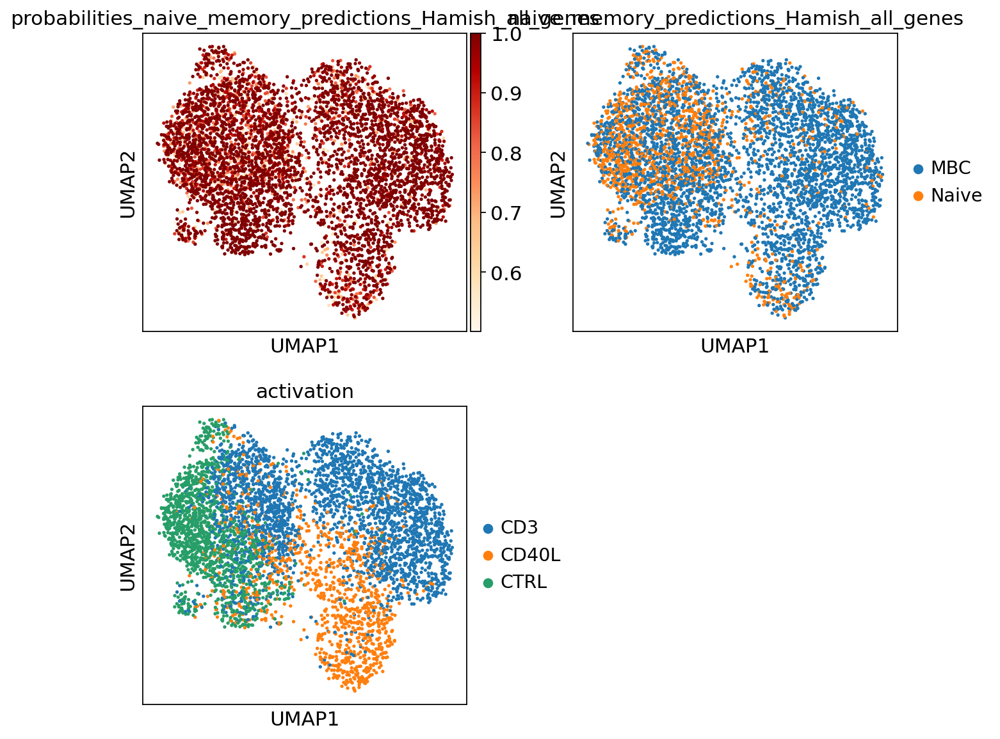

In [132]:
sc.pl.umap(adata_hvg, color = [#'probabilities_GC_hvgs', 'GC_celltype_predictions_hvgs',
                               'probabilities_naive_memory_predictions_Hamish_all_genes', 'naive_memory_predictions_Hamish_all_genes',
                              'activation'],
           ncols=2,
           cmap='OrRd')

In [133]:
table_predictions = adata_hvg.obs.loc[:, ['naive_memory_predictions_Hamish_all_genes', 'probabilities_naive_memory_predictions_Hamish_all_genes']]

In [134]:
table_predictions.head()

,naive_memory_predictions_Hamish_all_genes,probabilities_naive_memory_predictions_Hamish_all_genes
index,,
TCAGGATCAGTTTACG-1,MBC,0.996569
GATCGCGTCCTACAGA-1,MBC,0.557541
CGATCGGCACGGCCAT-1,MBC,0.962025
CATGACACAACCGCCA-1,MBC,0.993500
GACAGAGAGTGTTTGC-1,MBC,0.892330


In [135]:
table_predictions.shape

(5119, 2)

In [136]:
table_predictions.to_csv(save_path + 'table_predictions_naive_memory_B_cells_from_Hamish_B_cells_20210216.csv')

# --> DE for Gc-like B cells is happening in S3 notebook

# Not doing this any more: Predicting Naive/Memory B cells from (b) [covid dataset](https://www.covid19cellatlas.org/index.patient.html) (Immunodeficiency PBMCs)

In [9]:
# id for immunodeficiency
adata_covid_id = sc.read('./immunodeficiency_PMBCs.h5ad')

In [10]:
adata_covid_id

AnnData object with n_obs × n_vars = 240627 × 33759
    obs: 'PreCondition', 'Hospitalized', 'Disease_classification', 'Deconvolved_samples', 'MT_fraction', 'log1p_total_counts', 'log2p1_nCiteseq_count', 'n_genes_by_counts', 'nCiteseq_features', 'CellType', 'Lab number', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'Cell sorting'
    var: 'gene_ids', 'feature_types', 'RBC_0', 'RBC_1', 'RBC_2', 'RBC_3', 'RBC_4', 'RBC_5', 'RBC_6', 'RBC_7', 'RBC_8', 'RBC_filtered'
    uns: '28-day death_colors', 'Admitted to hospital_colors', 'BLD_scmap_colors', 'CellType_colors', 'Pre-existing diabetes_colors', 'Pre-exis

In [11]:
# here the values are log2(raw_count + 1), using these
adata_covid_id.X

<240627x33759 sparse matrix of type '<class 'numpy.float64'>'
	with 458138140 stored elements in Compressed Sparse Column format>

In [13]:
np.unique(adata_covid_id.obs['CellType'])

array(['Activated monocytes', 'Bcells memory', 'Bcells naive',
       'Classical monocytes', 'Cycling Lymphocytes', 'Erythrocytes',
       'Gamma-delta', 'IFN Lymphocytes', 'Intermediate monocytes',
       'Low qc', 'Low qc monocytes', 'NK cytokine secretion',
       'NK cytolitic', 'Non-classical monocytes', 'Plasma Bcells',
       'Platets', 'Progenitors', 'Tcells CD4', 'Tcells CD8',
       'Tcells CD8 IL10', 'Tcells memory CD4', 'Tcells memory CD8',
       'Tcells naive', 'Treg', 'cDC1', 'cDC2', 'cell doublet',
       'filtered cells', 'pDC'], dtype=object)

In [14]:
# subsetting to only B cell clusters
adata_covid_id = adata_covid_id[adata_covid_id.obs['CellType'].isin(['Bcells memory', 'Bcells naive'])]

In [15]:
# scaling
sc.pp.scale(adata_covid_id, max_value=10)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [16]:
adata_hvg_B_cells = adata_hvg[adata_hvg.obs['cell_type_final'].isin(['B_cells_memory', 'B_cells_naive', 'Plasma_cells'])].copy()

In [17]:
adata_B_full = anndata.AnnData(X = adata_hvg_B_cells.raw.X,
                              obs = adata_hvg_B_cells.obs,
                              var = adata_hvg_B_cells.raw.var,
                              obsm = adata_hvg_B_cells.obsm,
                              varm = adata_hvg_B_cells.raw.varm)

# scaling
sc.pp.scale(adata_B_full, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [18]:
# full (all genes) versions of the annotated object and test object
# here both the datasets are normalised, log transformed and scaled
adata_train = adata_covid_id.copy()

adata_test = adata_B_full.copy()

In [19]:
adata_test

AnnData object with n_obs × n_vars = 14862 × 22144
    obs: 'n_genes', 'stimulation', 'sample', 'cell_id', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'cell_type_final', 'S_score', 'G2M_score', 'phase', 'louvain', 'n_counts_protein', 'n_counts_protein_lognorm', 'donor', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'f

In [20]:
adata_train

AnnData object with n_obs × n_vars = 6927 × 33759
    obs: 'PreCondition', 'Hospitalized', 'Disease_classification', 'Deconvolved_samples', 'MT_fraction', 'log1p_total_counts', 'log2p1_nCiteseq_count', 'n_genes_by_counts', 'nCiteseq_features', 'CellType', 'Lab number', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'Cell sorting'
    var: 'gene_ids', 'feature_types', 'RBC_0', 'RBC_1', 'RBC_2', 'RBC_3', 'RBC_4', 'RBC_5', 'RBC_6', 'RBC_7', 'RBC_8', 'RBC_filtered', 'mean', 'std'
    uns: '28-day death_colors', 'Admitted to hospital_colors', 'BLD_scmap_colors', 'CellType_colors', 'Pre-existing diabetes_color

### Subsetting both datasets' copies to common genes only

I will train logreg on the subsetted data and tranfer the annotation onto the corresponding subsetted new data and then transfer that onto the full (with all genes) new dataset

In [21]:
# list of genes shared between blood and bone marrow data
# doing sorted on the overall list is VERY important for consistent ordering of the genes
common_genes = sorted(list(set(adata_train.var_names) & set(adata_test.var_names)))
print(len(common_genes),"genes are shared between previous training and test data \n",
      len(set(adata_train.var_names)), 'genes in training data \n',
      len((set(adata_test.var_names))), 'genes in test joint data \n')

17062 genes are shared between previous training and test data 
 33759 genes in training data 
 22144 genes in test joint data 



In [22]:
adata_train.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.4', 'AL732372.1', 'OR4F29', 'AC114498.1',
       ...
       'ab_CD101(BB27)', 'ab_CD360(IL-21R)', 'ab_CD88(C5aR)', 'ab_HLA-F',
       'ab_NLRP2', 'ab_Podocalyxin', 'ab_CD224', 'ab_anti-c-Met',
       'ab_CD258(LIGHT)', 'ab_DR3(TRAMP)'],
      dtype='object', length=33759)

Going to copy a joint dataset with only common genes, but then transfer annotation from logreg onto the full dataset

In [23]:
adata_train_copy = adata_train[:,common_genes]

In [24]:
adata_train_copy.var_names

Index(['A1BG', 'A1BG-AS1', 'A2M', 'A2M-AS1', 'A2ML1', 'A4GALT', 'A4GNT',
       'AAAS', 'AACS', 'AADAT',
       ...
       'ZW10', 'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B',
       'ZYX', 'ZZEF1'],
      dtype='object', length=17062)

In [25]:
adata_test_copy = adata_test[:,common_genes]
adata_test_copy.var_names

Index(['A1BG', 'A1BG-AS1', 'A2M', 'A2M-AS1', 'A2ML1', 'A4GALT', 'A4GNT',
       'AAAS', 'AACS', 'AADAT',
       ...
       'ZW10', 'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B',
       'ZYX', 'ZZEF1'],
      dtype='object', length=17062)

In [26]:
# checking gene correspondence!
list(adata_test_copy.var_names) == list(adata_train_copy.var_names)

True

In [27]:
adata_train_copy

View of AnnData object with n_obs × n_vars = 6927 × 17062
    obs: 'PreCondition', 'Hospitalized', 'Disease_classification', 'Deconvolved_samples', 'MT_fraction', 'log1p_total_counts', 'log2p1_nCiteseq_count', 'n_genes_by_counts', 'nCiteseq_features', 'CellType', 'Lab number', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'Cell sorting'
    var: 'gene_ids', 'feature_types', 'RBC_0', 'RBC_1', 'RBC_2', 'RBC_3', 'RBC_4', 'RBC_5', 'RBC_6', 'RBC_7', 'RBC_8', 'RBC_filtered', 'mean', 'std'
    uns: '28-day death_colors', 'Admitted to hospital_colors', 'BLD_scmap_colors', 'CellType_colors', 'Pre-existing diabet

In [28]:
np.unique(adata_train_copy.obs['CellType'],return_counts=True)

(array(['Bcells memory', 'Bcells naive'], dtype=object), array([1574, 5353]))

# Training a logistic regression model on previously annotated SS2 data

In [29]:
adata_train_copy.obs['CellType'].head()

I-O-1_13_T_AAACGGGAGGTAGCCA-1-0    Bcells memory
I-O-1_13_T_AAAGATGTCAGGCGAA-1-0     Bcells naive
I-O-1_13_T_AAAGCAACAGACAGGT-1-0     Bcells naive
I-O-1_13_T_AAAGCAATCTCTGTCG-1-0     Bcells naive
I-O-1_13_T_AACCATGAGTCGTTTG-1-0    Bcells memory
Name: CellType, dtype: category
Categories (2, object): [Bcells naive < Bcells memory]

In [30]:
celltypes_train = adata_train_copy.obs['CellType']

In [31]:
adata_train_copy.X.shape

(6927, 17062)

Using ONLY COMMON GENES

In [32]:
%%time
# training a logistic regression model
logisticRegr = LogisticRegression(max_iter = 10000, n_jobs = -1, random_state = 0, C=0.2)
logisticRegr.fit(adata_train_copy.X, celltypes_train)

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1544: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


CPU times: user 1min 22s, sys: 2min 5s, total: 3min 28s
Wall time: 45.6 s


LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [33]:
# already done
# Saving model based on all genes
pkl_filename = "logreg_from_covid_all_genes_20210113.pkl"  
with open(pkl_filename, 'wb') as file:  
    pickle.dump(logisticRegr, file)

In [34]:
adata_train_copy

View of AnnData object with n_obs × n_vars = 6927 × 17062
    obs: 'PreCondition', 'Hospitalized', 'Disease_classification', 'Deconvolved_samples', 'MT_fraction', 'log1p_total_counts', 'log2p1_nCiteseq_count', 'n_genes_by_counts', 'nCiteseq_features', 'CellType', 'Lab number', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'Cell sorting'
    var: 'gene_ids', 'feature_types', 'RBC_0', 'RBC_1', 'RBC_2', 'RBC_3', 'RBC_4', 'RBC_5', 'RBC_6', 'RBC_7', 'RBC_8', 'RBC_filtered', 'mean', 'std'
    uns: '28-day death_colors', 'Admitted to hospital_colors', 'BLD_scmap_colors', 'CellType_colors', 'Pre-existing diabet

In [35]:
adata_test_copy

View of AnnData object with n_obs × n_vars = 14862 × 17062
    obs: 'n_genes', 'stimulation', 'sample', 'cell_id', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'cell_type_final', 'S_score', 'G2M_score', 'phase', 'louvain', 'n_counts_protein', 'n_counts_protein_lognorm', 'donor', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_id

In [36]:
logisticRegr

LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [37]:
%%time
predictions = logisticRegr.predict(adata_test_copy.X)
adata_test_copy.obs['celltype_predictions_all_genes_from_covid'] = predictions

Trying to set attribute `.obs` of view, copying.


CPU times: user 12.7 s, sys: 4.56 s, total: 17.3 s
Wall time: 15.6 s


In [38]:
%%time
# probabilities
probabilities = logisticRegr.predict_proba(adata_test_copy.X)
probs_adata = []
for i,clus in enumerate(adata_test_copy.obs['celltype_predictions_all_genes_from_covid']):
    probs_adata.append(probabilities[i,logisticRegr.classes_==clus][0])


CPU times: user 1.3 s, sys: 1.46 s, total: 2.76 s
Wall time: 877 ms


In [39]:
# need to only assign predictions and probabilities to B cell clusters
list(adata_test_copy.obs.index) == list(adata_hvg.obs.index)

False

In [40]:
adata_test_copy.obs['probabilities_from_covid_all_genes'] = probs_adata

In [41]:
def add_predictions_and_probs(barcode, 
                              col # either celltype_predictions_all_genes_from_SS2 or probabilities_from_SS2_all_genes
                             ):
    
    barcode_is_B_cell = barcode in adata_test_copy.obs_names
    
    if barcode_is_B_cell:
        value = adata_test_copy.obs.loc[barcode, col]
        return(value)
    else:
        if col == 'probabilities_from_covid_all_genes':
            return(0)
        elif col == 'celltype_predictions_all_genes_from_covid':
            return('NA')
        

In [42]:
adata_hvg.obs['barcode'] = adata_hvg.obs.index

In [43]:
for column in ['celltype_predictions_all_genes_from_covid','probabilities_from_covid_all_genes']:
    print(column)
    adata_hvg.obs[column] = adata_hvg.obs['barcode'].apply(lambda x: add_predictions_and_probs(x, column))

celltype_predictions_all_genes_from_covid
probabilities_from_covid_all_genes


... storing 'cell_type_final' as categorical
... storing 'celltype_predictions_all_genes_from_covid' as categorical


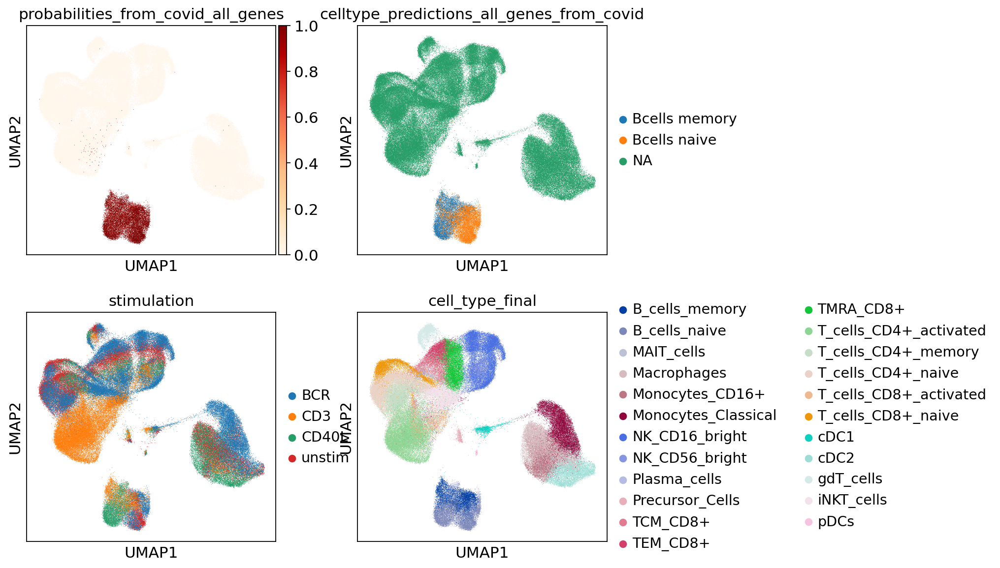

In [44]:
sc.pl.umap(adata_hvg, color = [#'probabilities_GC_hvgs', 'GC_celltype_predictions_hvgs',
                               'probabilities_from_covid_all_genes', 'celltype_predictions_all_genes_from_covid',
                              'stimulation', 'cell_type_final'],
           ncols=2,
           cmap='OrRd')

### this makes sense because in the covid dataset there were only non-activated B cells, so here it predicts B memory lables in the activated B cell compartment, although correctly predicts the B cells in unstim + BCR compartment

In [45]:
table_predictions_from_covid = adata_hvg.obs.loc[:, ['celltype_predictions_all_genes_from_covid', 'probabilities_from_covid_all_genes']]

In [46]:
table_predictions_from_covid.head()

,celltype_predictions_all_genes_from_covid,probabilities_from_covid_all_genes
AAACCTGAGAATGTGT-1,NA,0.0
AAACCTGAGACTAAGT-1,NA,0.0
AAACCTGAGCCGCCTA-1,NA,0.0
AAACCTGAGCGCCTCA-1,NA,0.0
AAACCTGAGGATGTAT-1,NA,0.0


In [47]:
table_predictions_from_covid.shape

(145823, 2)

In [48]:
table_predictions_from_covid.to_csv(save_path + 'table_predictions_naive_memory_B_cells_from_covid_GEX_and_SoupX_denoised_protein_all_samples_20210113.csv')

In [148]:
# how are these predictions distributed across activations?
adata_hvg_B_cells = adata_hvg[adata_hvg.obs['cell_type_final'].isin(['B_cells_memory', 'B_cells_naive', 'Plasma_cells'])].copy()

In [149]:
df_stats = pd.DataFrame(columns=list(np.unique(adata_hvg_B_cells.obs['naive_memory_predictions_all_genes'])),
                     index=list(np.unique(adata_hvg_B_cells.obs['stimulation'])))

In [150]:
df_stats

,MBC,Naive
BCR,NaN,NaN
CD3,NaN,NaN
CD40L,NaN,NaN
unstim,NaN,NaN


In [151]:
for prediction in df_stats.columns:
    print('prediction', prediction)
    for stimulation in df_stats.index:
        #print(sample)
        df_stats.loc[stimulation, prediction] = adata_hvg[(adata_hvg.obs['stimulation'] == stimulation)
                                         & (adata_hvg.obs['naive_memory_predictions_all_genes'] == prediction)].X.shape[0]

prediction MBC
prediction Naive


In [152]:
df_stats

,MBC,Naive
BCR,2031,1233
CD3,2471,514
CD40L,4844,689
unstim,1580,1500


In [125]:
#cols_new_order = [str(i) for i in range(1,22)]
#df_new = df_new[cols_new_order]
#df_new

Text(0.5, 0, 'stimulation')

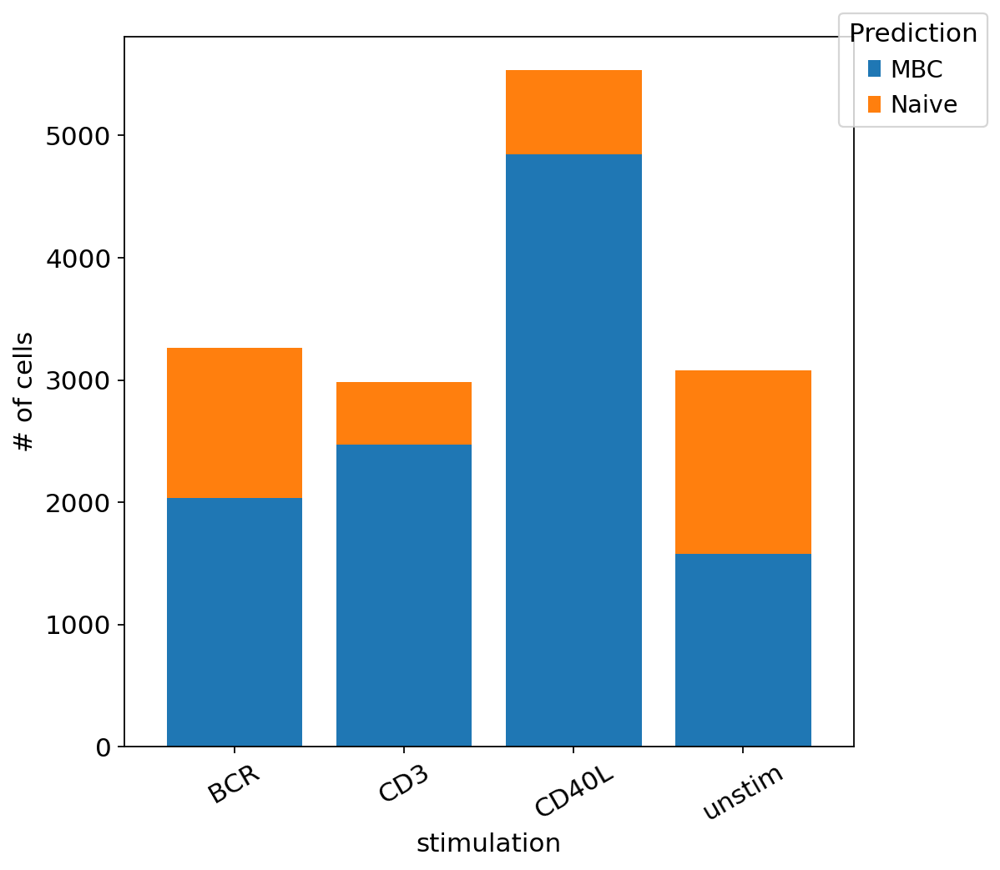

In [153]:
# this is for final cells only

ax = df_stats.plot.bar(stacked=True, figsize=(7,7), width=0.8)

handles, labels = ax.get_legend_handles_labels()

ax.legend(handles,
          labels, title='Prediction',
          bbox_to_anchor=(1.20, 1.05))

ax.set_xticklabels(labels=['BCR',
                           'CD3',
                           'CD40L',
                           'unstim'])
ax.tick_params(axis='x', rotation=30)

# to turn off the grid
plt.grid(b=None)

#plt.title('CITE-seq sample composition')
plt.ylabel('# of cells')
plt.xlabel('stimulation')

#plt.savefig('./figures/CITE-seq_sample_composition_all_samples_final_cells_20210112.pdf',
#           bbox_inches='tight')

## Preparing the object for cellxgene

In [199]:
adata_hvg

AnnData object with n_obs × n_vars = 5323 × 2804 
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type_predictions', 'probabilities', 'barcode', 'GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes', 'GC_celltype_predictions_hvg', 'probabilities_GC_hvg', 'celltype_predictions_all_genes_from_SS2', 'probabilities_from_SS2_all_genes', 'naive_memory_predictions_Hamish_all_genes', 'probabilities_naive_memory_predictions_Hamish_all_genes', 'louvain'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'

In [200]:
adata_full = anndata.AnnData(X=adata_hvg.raw.X,
                            obs=adata_hvg.obs,
                            var=adata_hvg.raw.var,
                            obsm=adata_hvg.obsm)

In [201]:
adata_full

AnnData object with n_obs × n_vars = 5323 × 17976 
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type_predictions', 'probabilities', 'barcode', 'GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes', 'GC_celltype_predictions_hvg', 'probabilities_GC_hvg', 'celltype_predictions_all_genes_from_SS2', 'probabilities_from_SS2_all_genes', 'naive_memory_predictions_Hamish_all_genes', 'probabilities_naive_memory_predictions_Hamish_all_genes', 'louvain'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5

In [202]:
import scipy
adata_full.X = scipy.sparse.csc_matrix(adata_full.X)


In [203]:
adata_full.obs.columns

Index(['activation', 'barcode_sample', 'batch', 'bh_pval', 'condition',
       'n_counts', 'n_genes', 'percent_mito', 'sample',
       'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet',
       'S_score', 'G2M_score', 'phase', 'cell_type_predictions',
       'probabilities', 'barcode', 'GC_celltype_predictions_all_genes',
       'probabilities_GC_all_genes', 'GC_celltype_predictions_hvg',
       'probabilities_GC_hvg', 'celltype_predictions_all_genes_from_SS2',
       'probabilities_from_SS2_all_genes',
       'naive_memory_predictions_Hamish_all_genes',
       'probabilities_naive_memory_predictions_Hamish_all_genes', 'louvain'],
      dtype='object')

In [204]:
categ_columns = ['activation', 'batch', 'condition',
        'sample', 'phase', 
        'cell_type_predictions', 
       'GC_celltype_predictions_all_genes', 
       'celltype_predictions_all_genes_from_SS2',
       'naive_memory_predictions_Hamish_all_genes',
       'louvain']

cont_columns = ['n_counts', 'n_genes', 'percent_mito',
                'scrublet_cluster_score', 'scrublet_score', 'S_score', 'G2M_score', 
                'probabilities', 'probabilities_GC_all_genes', 'probabilities_from_SS2_all_genes', 'probabilities_naive_memory_predictions_Hamish_all_genes'
               ]


In [205]:
import pandas
for column in categ_columns:
    adata_full.obs[column] = pd.Categorical(adata_full.obs[column])
    
for column in cont_columns:
    adata_full.obs[column] = np.float32(adata_full.obs[column])

In [206]:
adata_full.write(save_path + 'adata_BBKNN_by_sample_twins_reanalysed_for_cellxgene_B_cells.h5ad')

In [208]:
save_path + 'adata_BBKNN_by_sample_twins_reanalysed_for_cellxgene_B_cells.h5ad'

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/adata_BBKNN_by_sample_twins_reanalysed_for_cellxgene_B_cells.h5ad'